# Exploration.10 - CIFAR-10을 이용하여 새로운 이미지 만들기

## 기본 개념

### 1.  Pix2Pix (Pixel to Pixel)

![p2p](https://d3s0tskafalll9.cloudfront.net/media/images/pix2pix.max-800x600.png)

- Pix2Pix : 한 이미지를 다른 이미지로 픽셀단위를 변환하여 만듦
- 이미지(Input Image)와 실제 이미지(Ground Truth)가 쌍을 이루는 데이터셋으로 학습을 진행
    - 실제 이미지 : label
- 학습을 통해 얻은 Predicted Image와 실제이미지(Ground Truth)를 비교해가며 학습이 반복될 수록 실제와 같은 이미지를 만들어냄

### 2. GAN

- Generator
    - 이미지 생성
    - fake를 실물과 같이 만드는게 목적
- Discriminator
    - fake와 real을 제대로 판별게 목적

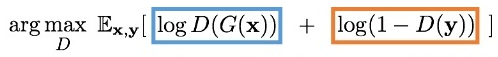 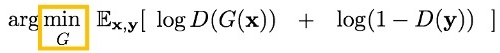 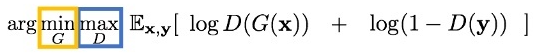

- Discriminator에서의 loss
    - logD(G(x))를 통해 G가 만들어내는 결과는 1(fake)에 가깝게 만들어야함
    - log(1−D(y))를 통해 실제 정답 이미지는 0(real)에 가깝게 만들어야함
<br><br>
- Generator에서의 loss
    - logD(G(x))를 통해 G가 만들어내는 결과는 0(real)에 가깝게 만들어야함
    - log(1−D(y))를 통해 실제 정답 이미지는 1(fake)에 가깝게 만들어야함  
<br><br>
- 전체 목표 : 잘 학습된 Discriminator를 잘 속이는 Generator를 만들어야함
- GAN : http://www.kwangsiklee.com/2018/03/cyclegan%EC%9D%B4-%EB%AC%B4%EC%97%87%EC%9D%B8%EC%A7%80-%EC%95%8C%EC%95%84%EB%B3%B4%EC%9E%90/

### 3. CycleGAN

![cycleGan](https://d3s0tskafalll9.cloudfront.net/media/images/CycleGAN.max-800x600.png)

- cycleGAN
    - Generator가 새로운 이미지를 만들 때 원본으로 복구가능한 정도로 바꿔야함
    - 원본 이미지로 새로운 이미지를 만들고 새로운 이미지로 원본 이미지와 같이 만들 수 있음

### 4. Pix2Pix와 cycleGAN의 비교

- Pix2Pix
    - 한 방향으로만 변환 가능 (간단한 이미지로 실물과 같은 이미지 생성)
    - 그림(입력)과 사진(출력)의 쌍으로 이루어진 데이터셋 필요
- cycleGAN
    - 양 방향으로 변환 가능 (원본 이미지 <-> 새로운 이미지)
    - 입력과 출력의 쌍이 필요없음 (새로운 이미지는 전혀 다른 이미지를 가져와도 됨)
<br><br>
- cycleGAN의 장점
    - 쌍으로 된 데이터(paired data)가 필요없어 데이터를 구하기 쉬움
    - label을 붙이는 비용이 필요 없음

## import Package

In [1]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

print("tensorflow", tf.__version__)

tensorflow 2.6.0


## 데이터 불러오기

In [2]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

train_x.shape

(50000, 32, 32, 3)

- test_y를 무시하기 위해 \_(언더스코어)를 사용

- 학습에 사용하려는 train_x의 구성
    - (32, 32)의 3개 채널(RGB)을 가진 이미지
    - train 데이터 갯수 : 50,000개

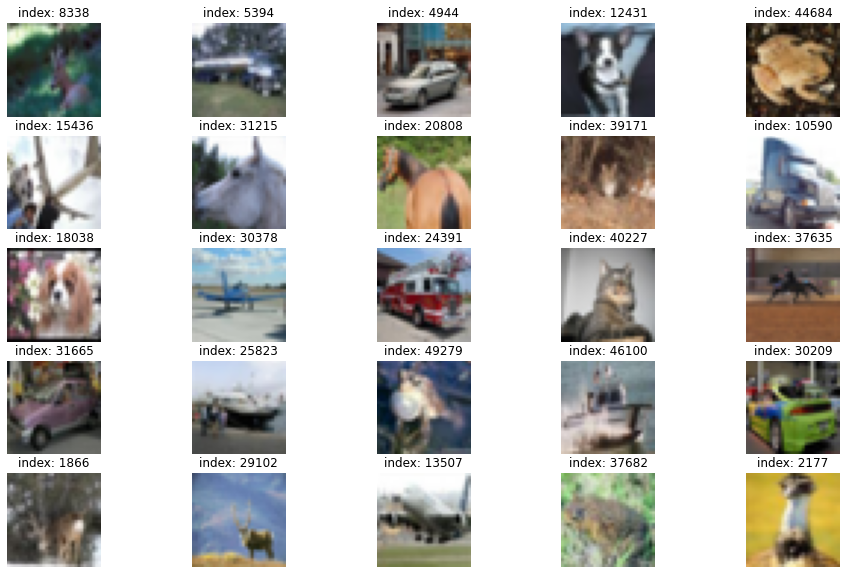

In [3]:
plt.figure(figsize=(16, 10))

for i in range(25):
    r = np.random.randint(0, 50000)
    plt.subplot(5, 5, i+1)
    plt.imshow(train_x[r].reshape(32, 32, 3))
    plt.title(f'index: {r}')
    plt.axis('off')
plt.show()

- 데이터 50,000개 중 랜덤으로 25장을 추출함

## Preprocessing

In [4]:
print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 255
min pixel: 0


In [5]:
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화합니다.

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


- 0 ~ 255값을 가지는 픽셀을 -1 ~ 1값을 가지도록 함
- zero_centered함

## mini-Batch 데이터셋 구성

In [6]:
BUFFER_SIZE = 50000
BATCH_SIZE = 256

- BURRER_SIZE
    - 데이터가 잘 섞이게 하기 위해 버퍼 사이즈를 train 데이터 사이즈와 동일하게 설정함
    - 50,000으로 설정
- BATCH_SIZE
    - 미니 배치 학습에 너무 많은 양을 한 번에 학습시키면 메모리 활용 면에서 비효율적임
    - BATCH_SIZE가 너무 크면 한 번 학습하는 데에도 많은 시간이 걸림
    - 256로 설정 

In [7]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

- from_tensor_slices()를 이용하여 train_x에서 미니배치 데이터셋 구성
- 학습할때 매번 데이터를 섞어서 넣어주지 않아도 됨
- 학습량은 BATCH_SIZE만큼 이루어짐

In [8]:
train_dataset

<BatchDataset shapes: (None, 32, 32, 3), types: tf.float64>

## 생성자(Generator) 모델 구현

In [9]:
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(4*4*256, use_bias=False, input_shape=(100,)))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Second: Reshape layer
    model.add(layers.Reshape((4, 4, 256)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Conv2DTranspose(128, kernel_size=(4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(0.2))

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='tanh'))

    return model

- 생성자(Generator) : 아무 의미 없는 랜덤 노이즈로부터 신경망에서의 연산을 통해 이미지 형상의 벡터를 생성
- input은 batch_size만큼 (100,)벡터를 받아 입력함
- Dense layer에서 4\*4\*256만큼의 노드를 지나서 output 출력
- BatchNormalization 레이어는 신경망의 가중치가 폭발하지 않도록 가중치 값을 정규화  
    - version.3까지는 BatchNormalization을 활용하였지만 version.4에서부터는 제거함
    - test에 대한 prediction이 따로 없으므로 overfitting을 방지할 필요가 적다고 판단됨
    - 판별자에 비해 생성자의 성능이 비교적 딸린다고 생각되어 학습을 저하시키는 요소 제거
- Conv2DTranspose 층은 일반적인 Conv2D와 반대로 이미지 사이즈를 넓혀주는 층
- 마지막 층의 Activation funtion은 tanh를 사용하여 정규화한 -1 ~ 1 사이의 픽셀값과 동일하게 맞춤

In [10]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4096)              409600    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 4096)              0         
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         524416    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 128)       262272    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 128)       0

- reshape()로 벡터를 (4,4,256)의 3차원 tensor로 변환시킴
- Conv2DTranspose층을 이용해서 (4,4,256) -> (8,8,128) -> (16,16,128) -> (32,32,128) -> (32,32,3)으로 이미지 사이즈를 키움  
(train의 이미지 (32,32,3)과 동일하게 함)

### 랜덤 노이즈 벡터를 통해 결과물 체크

In [11]:
noise = tf.random.normal([1, 100])

- tf.random.normal을 이용하여 가우시안 분포에서 뽑아낸 100개의 랜덤한 수로 이루어진 노이즈 벡터 생성

In [12]:
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

- 학습에 영향을 주지 않도록 training=False로 함
- 학습을 진행할 때는 training=True로 지정할 예정
<br><br>
- 텐서의 형태는 (32, 32, 3)
- batch_size는 1

### Clipping 문제 해결

In [13]:
def clipping(x):
    x = (x+1)/2
    return x

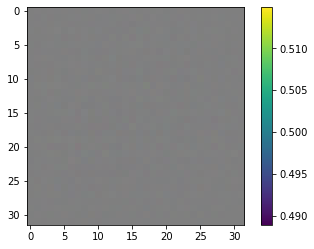

In [14]:
plt.imshow(clipping(generated_image[0, :, :, :]))
plt.colorbar()
plt.show()

- matplotlib는 2차원 이미지만 보여줄 수 있으므로 0번째와 3번째 축의 인덱스를 0으로 설정
- (32, 32) shape의 이미지를 꺼낼 수 있도록 함
- 픽셀의 값은 0 ~ 1 사이에 있음 (clipping함수로 인해 시각화할 때만 픽셀값이 0 ~ 1사이로 지정)

## 판별자(Discriminator) 모델 구현

In [15]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (3, 3), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))

    model.add(layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Third: Flatten Layer
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

- 판별자는 기존에 있던 진짜 이미지와 생성자가 만들어낸 이미지를 입력받아 각 이미지가 Real 인지, Fake 인지에 대한 판단 정도를 실숫값으로 출력
- 판별자는 Conv2D층으로 이미지 크기를 점점 줄여나감
- Dropout()을 이용하여 Overfitting 가능성을 낮춤 (0.3 확률로 노드 유닛을 제거)
- Flatten()으로 1차원 벡터 형태로 변환 (생성자의 Reshape층과 반대 역할)
- Dense layer를 통해 하나의 값 출력

In [16]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)        

- Conv2D층을 이용해서 (32,32,3) -> (32,32,64) -> (16, 16, 128) -> (8,8,128) -> (4,4,256)으로 이미지 사이즈를 줄임
- Flatten()으로 (4,4,256)의 tensor를 1차원 벡터 형태로 변환시킴

In [17]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[-0.00022009]], dtype=float32)>

- 생성자를 통해 만들어진 generated_image를 판별자로 판별했을 때 1개의 결과값을 출력한 것을 볼 수 있음

## Loss funtion 구현

In [18]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

- tf.keras.losses의 BinaryCrossEntropy는 기본적으로 input값을 0 ~ 1 사이에 분포하는 확률값으로 가정함
- from_logits=True : BinaryCrossEntropy에 입력된 값을 함수 내부에서 sigmoid 함수를 사용해 0 ~ 1 사이의 값으로 정규화한 후 알맞게 계산

### 1. Loss funtion의 목표
- Real Image에 대한 label을 1, Fake Image에 대한 label을 0으로 가정
<br><br>
- 생성자
    - 판별자가 Fake Image에 대해 판별한 값, 즉 D(fake_image) 값이 1에 가까워지는 것
- 판별자
    - Real Image 판별값, 즉 D(real_image)는 1에 가까워지는 것
    - Fake Image 판별값, 즉 D(fake_image)는 0에 가까워지는 것

### 2. generator_loss (생성자 loss)

In [19]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

- fake_output이 1에 가까워져야함
- tf.ones_like()를 통해 1과 비교해야함
- fake_output이 Real Image(1)에 가까울수록 loss값이 작아짐

### 3. discriminator_loss (판별자 loss)

In [20]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

- 판별자는 REal Image와 Fake Image를 구분해야 하므로 두 개의 loss를 모두 계산해야함
- real_output 값은 Real Image(1)에 가까워야 함 (tf.ones_like()와 비교)
- fake_output 값은 Fake Image(0)에 가까워야 함 (tf.zeros_like()와 비교)

## 판별 정확도를 나타내는 함수 구현

In [21]:
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

- 판별자의 accuracy는 0.5에 가까워지는 것이 이상적임
    - real_output은 1에 가깝게 맞춰야함
        - 0.5와 비교하여 real_output이 크면 true로 반환하여 accuracy를 구함
    - fake_output은 0에 가깝게 맞춰야함
        - 0.5와 비교하여 fake_output이 작으면 true로 반환하여 accuracy를 구함
<br><br>
- fake accuracy가 1.0에 가깝다면 생성자가 판별자를 속일 수 있는 정도의 새로운 이미지를 만들지 못하고 있는 것

- tf.math.greater_equal() : real_output과 tf.constant([0.5])를 크기 비교
    - real_output >= tf.constant([0.5]) : True
    - real_output <= tf.constant([0.5]) : False
<br><br>
- tf.math.less() : fake_output과 tf.constant([0.5])를 크기 비교
    - fake_output < tf.constant([0.5]) : True
    - fake_output > tf.constant([0.5]) : False

- 텐서플로우 논리연산 : https://chan-lab.tistory.com/9

## Optimizer 정의

In [22]:
generator_optimizer = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)

/opt/conda/lib/python3.9/site-packages/keras/optimizer_v2/optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


- 생성자와 판별자는 따로 학습을 진행하므로 optimizer를 따로 만들어야 함
- learning rate는 0.0001로 설정함

## 학습 샘플 정하기

In [23]:
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

- num_examples_to_generate = 16 : 학습에 필요한 샘플은 16개로 생성
- 샘플은 매번 같은 노이즈로 생성해야 진전 과정을 볼 수 있으므로 고정된 seed 노이즈를 만듦
- 100차원의 16개의 노이즈

## train_step() 함수 구현
- 1개 미니배치의 훈련 과정을 처리

In [24]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

- 입력 데이터
    - Real Image 역할을 할 images 한 세트를 입력
    - 미니배치로 만들어준 train_dataset의 image를 입력할 예정
- 생성자 입력 노이즈
    - 생성자가 Fake Image를 생성하기 위한 noise 생성
    - BATCH_SIZE만큼 생성 (images도 BATCH_SIZE만큼 입력할 예정)
- tf.GradientTape()
    - 가중치 업데이트를 위해 gradient를 자동 미분하기 위한 with 구문 열음
- generated_images
    - 생성자 모델인 generator가 noise를 입력받아 generated_images 생성
    - (100,)벡터를 입력받아 (32,32,3)의 이미지를 출력함
- discriminator 판별
    - 판별자 모델인 discriminator는 하나의 값을 출력함
    - images를 판별하면 real_output으로 지정
    - generated_images를 판별하면 fake_output으로 지정
- loss 계산
    - fake_output, real_output를 통해 각각 generator와 discriminator로 loss 계산
    - loss는 fake_output, real_output을 Real Image(1), Fake Image(0)과 비교하여 구함
- accuracy 계산
    - 판별 정확도를 나타내는 accuracy를 계산
    - real_accuracy와 fake_accuracy로 나눠짐
    - 각각의 accuracy는 fake_output, real_output을 기준인 0.5와 비교하여 True, False를 나타낸 후 측정
- gradient 계산
    - gradient를 자동 계산하기 위한 tf.GradientTape()을 gen_tape과 disc_tape으로 명명하여 계산함
    - 생성자 loss와 판별자 loss를 통해 생성자의 gradient와 판별자의 gradient을 각각 구함
- 모델 학습
    - 생성자 gradient와 판별자 gradient를 생성자와 판별자에 대해 각각 지정해준 optimizer를 통해 가중치 갱신
    - optimizer에서 따로 설정한 것은 learning_rate밖에 없음

## 훈련 과정 이미지를 시각화하고 저장하는 함수

In [25]:
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(clipping(predictions[i, :, :, :]))
        plt.axis('off')
   
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/try16/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()

- num_examples_to_generate = 16로 인해 훈련 샘플은 16개로 지정됨
- 4\*4 = 16개의 이미지를 시각화함
- plt.savefig로 파일을 저장함

## 훈련과정을 시각화하는 함수

In [26]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/try16/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

- loss와 accuracy를 시각화하는 함수
- train_step() 함수가 리턴하는 gen_loss, disc_loss, real_accuracy, fake_accuracy를 history에 저장
- gen_loss, disc_loss, real_accuracy, fake_accuracy는 history dictionary 안에 list 형태로 저장되어 있음

## checkpoint

In [27]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints/try16'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

- checkpoint : 정기적으로 모델을 저장하기 위함
- checkpoint에는 optimizer와 [생성자, 판별자가 학습한 모델의 가중치]를 모두 넣어 저장

## 모델 훈련

In [28]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 30 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

- 함수의 입력
    - dataset : train_dataset을 입력받을 예정
    - epochs
    - save_every : 모델 저장하는 간격
- dataset에서 it과 image_batch를 뽑아옴
    - image_batch : train_step()함수에 입력하고 gen_loss, disc_loss, real_accuracy, fake_accuracy를 출력함
- history
    - gen_loss, disc_loss, real_accuracy, fake_accuracy를 리스트 형태로 저장
- it
    - iter 횟수처럼 이용
    - 전체 train_dataset이 50,000개이고 BATCH_SIZE가 256이므로 it은 195까지 있음 (50,000 / 256 = 195.3125)
- if it % 30 == 0:
    - it이 195까지 있기 때문에 1, 31, 61, 91, 121, 151, 181번까지 이미지를 보여줌
    - 1 epoch당 이미지 변화 과정을 7번 볼 수 있음

In [29]:
save_every = 50
EPOCHS = 20

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

- save_every : 모델을 저장하는 간격을 담당

In [30]:
# %%time
# train(train_dataset, EPOCHS, save_every)

# 학습과정의 loss, accuracy 그래프 이미지 파일이 ~/aiffel/dcgan_newimage/cifar10/training_history 경로에 생성되고 있으니
# 진행 과정을 수시로 확인해 보시길 권합니다.

## 체크 포인트 불러오기

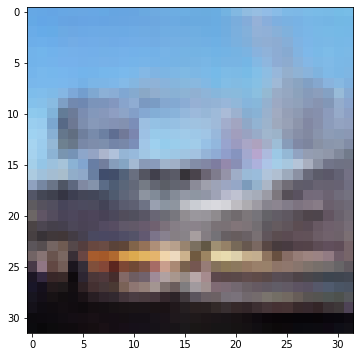

In [31]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints/try13'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

- 200번 학습이 진행된 파라미터를 가져옴 ([E-10]GAN_CycleGAN_CIFAR10_v.4.03 파일)
- 앞으로 20번의 추가 학습을 이어서 할 예정임

## 모델 재훈련

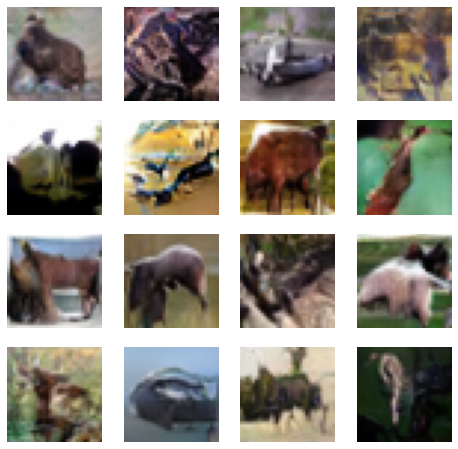

Time for training : 737 sec


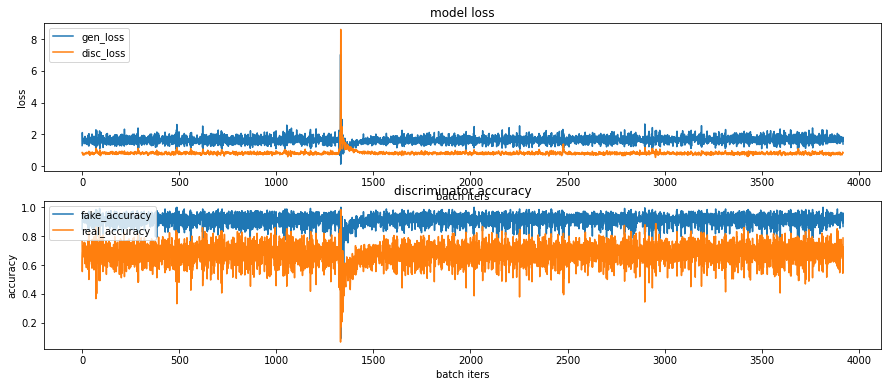

CPU times: user 12min 36s, sys: 40.9 s, total: 13min 17s
Wall time: 12min 18s


In [32]:
%%time
train(train_dataset, EPOCHS, save_every)

- fake_accuarcy는 아주 서서히 줄어들었음 (도중에 크게 fake_accuracy가 떨어진 지점이 있음)
- epoch가 20번밖에 되지 않아 변화량을 보여주기에 부족함
- 아래에서 fake_accuracy에 대해 다시 언급할 예정

## gif파일 만들기
- gif로 학습 과정을 통해 만들어진 이미지 변화를 파악

In [33]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_try16.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/try16/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_try16.gif

-rw-r--r-- 1 root root 2246306 Feb 13 12:21 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_try16.gif


## Version별 설정과 이미지

### 1. version.1

- BATCH_SIZE = 512
- Generator(생성자)
    - layer 5개
    - 첫 번째 : Dense
        - 8\*8\*256
        - BatchNormalization
        - LeakyReLU
    - 두 번째 : Reshape : 8, 8, 256
    - 세 번째 : Conv2DTranspose : 
        - 128, kernel_size=(5, 5), strides=(1, 1), padding='same'
        - BatchNormalization
        - LeakyReLU
    - 네 번재 : Conv2DTranspose : 
        - 64, kernel_size=(5, 5), strides=(2, 2), padding='same'
        - BatchNormalization
        - LeakyReLU 
    - 다섯 번재 : Conv2DTranspose : 
        - 3, kernel_size=(5, 5), strides=(2, 2), padding='same'
        - tanh
- discriminator(판별자)
    - 첫 번째 : Conv2D
        - 64, (5, 5), strides=(2, 2), padding='same'
        - LeakyReLU
        - Dropout(0.3)
    - 두 번째 : Conv2D
        - 128, (5, 5), strides=(2, 2), padding='same'
        - LeakyReLU
        - Dropout(0.3)
    - 세 번째 : Flatten
    - 네 번째 : Dense(1)
- learning rate : 0.0001
- EPOCHS = 250


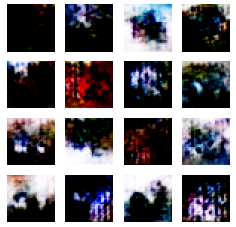

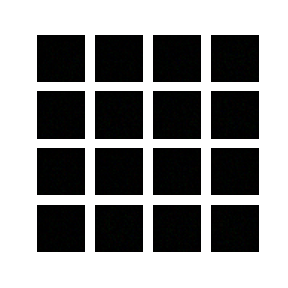

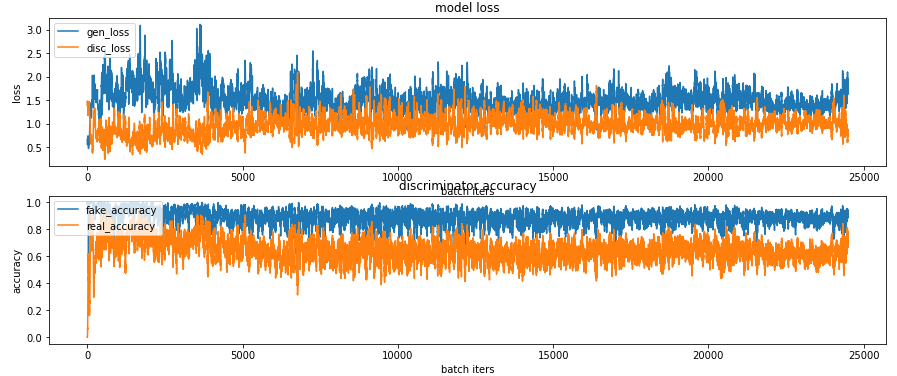

- 이미지를 잘 생성하지 못함 (마치 곰팡이와 같은 이미지 생성)
- facke_accuracy가 아주 서서히 떨어지는 걸 볼 수 있음

### 2. version.2

- BATCH_SIZE = 512
- Generator(생성자)
    - version.1과 동일
- discriminator(판별자)
    - version.1과 동일
- learning rate : 0.001 (version.1 : 0.0001)
- EPOCHS = 300

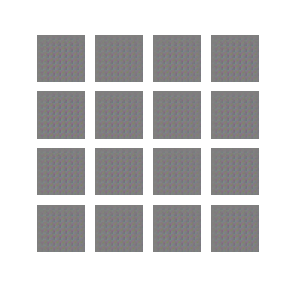

- 여전히 곰팡이같이 생긴 이미지만 생성

### 3. version.3

- BATCH_SIZE = 256
    - BATCH_SIZE를 줄이고 Iter 30번마다 이미지를 저장하게 하여 다채로운 변화를 보고자 함
- Generator(생성자)
    - **기존 버전보다 Dense Layer의 노드 수를 늘림**
    - **기존 버전보다 Conv2DTranspose의 층을 하나 더 늘림**
    - layer 6개
    - 첫 번째 : Dense
        - 8\*8\*512
        - BatchNormalization
        - LeakyReLU
    - 두 번째 : Reshape : 8, 8, 512
    - 세 번째 : Conv2DTranspose : 
        - 256, kernel_size=(5, 5), strides=(1, 1), padding='same'
        - BatchNormalization
        - LeakyReLU
    - 네 번재 : Conv2DTranspose : 
        - 128, kernel_size=(5, 5), strides=(1, 1), padding='same'
        - BatchNormalization
        - LeakyReLU 
    - 다섯 번재 : Conv2DTranspose : 
        - 64, kernel_size=(5, 5), strides=(2, 2), padding='same'
        - BatchNormalization
        - LeakyReLU 
    - 여섯 번재 : Conv2DTranspose : 
        - 3, kernel_size=(5, 5), strides=(2, 2), padding='same'
        - tanh
- discriminator(판별자)
    - **기존 버전보다 Conv2D의 층을 하나 더 늘림**
    - 첫 번째 : Conv2D
        - 64, (5, 5), strides=(2, 2), padding='same'
        - LeakyReLU
        - Dropout(0.3)
    - 두 번째 : Conv2D
        - 128, (5, 5), strides=(2, 2), padding='same'
        - LeakyReLU
        - Dropout(0.3)
    - 세 번째 : Conv2D
        - 256, (5, 5), strides=(1, 1), padding='same'
        - LeakyReLU
        - Dropout(0.3)        
    - 네 번째 : Flatten
    - 다섯 번째 : Dense(1)
- learning rate : 0.0001
- EPOCHS : version.3의 세부 버전별로 epochs를 다르게 함


#### version.3.04
- epochs : 300번

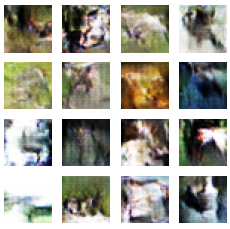

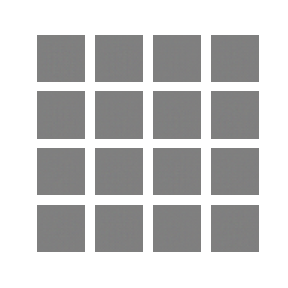

- 이미지 형태가 보이기 시작함

#### version.3.05
- epochs : 500번

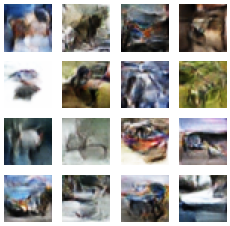

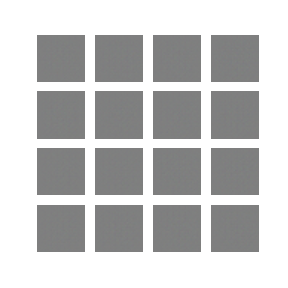

- 일부 이미지는 epoch 300번보다 선명해졌음
- 일부 이미지는 형태가 서서히 깨지기 시작함
- 이미지 별로 형태가 잡히는데 걸리는 시간이 다른 것으로 판단됨

#### version.3.06
- epochs : 800번
- 출력 이미지 사이즈를 키움

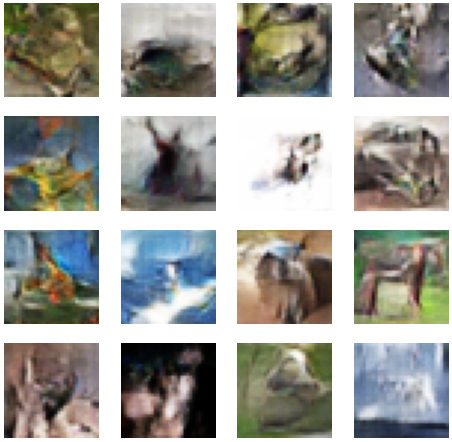

gif : https://github.com/TaeWonKang95/Aiffel_Exploration/blob/7dd5f069d7060eacbdc3eb5a5069acdca305ea19/Exploration.10/cifar10_dcgan_try8.gif

- 생성 과정을 틈틈이 살펴본 결과 대부분의 이미지가 생성되면서 오히려 형태가 깨지기도 함
- epoch가 너무 많은 것 같다고 판단됨
- gif파일은 용량이 너무 크기 때문에 따로 업로드함

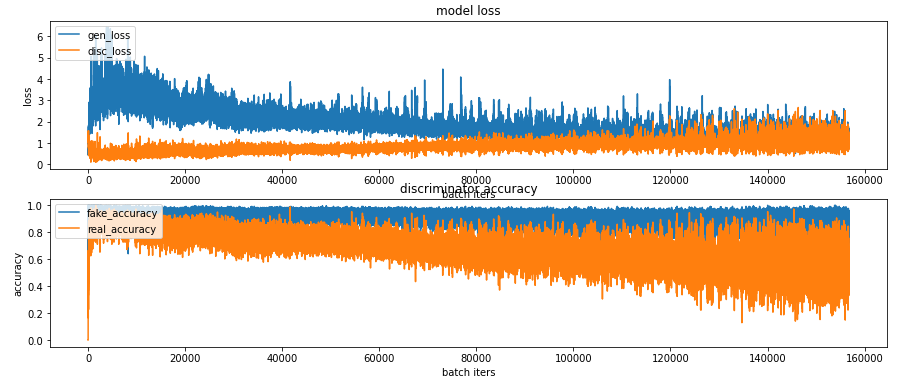

- fake_accuarcy는 매우 미세하게 떨어짐
- 학습이 진행될수록 real_accuracy의 폭이 매우 커짐
    - 학습이 진행될수록 실제 이미지를 맞추는 확률이 줄어드는 것을 파악함
    - 실제 이미지에 대한 판단력을 상실하고 있음

#### version.3.08
- epochs : 200번

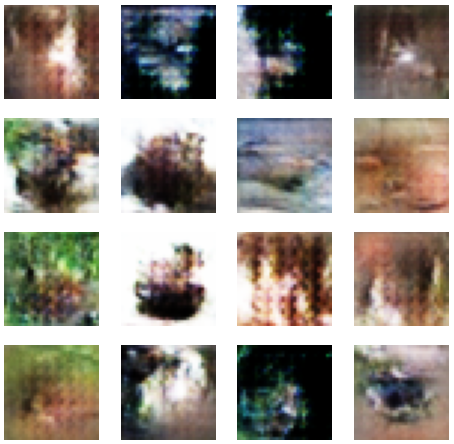

gif : https://github.com/TaeWonKang95/Aiffel_Exploration/blob/7dd5f069d7060eacbdc3eb5a5069acdca305ea19/Exploration.10/cifar10_dcgan_try9.gif

#### version.3.09
- version.3.08의 학습 결과에 따른 가중치(w)값을 checkpoint로 불러와 추가 학습시킴
- epochs : 300번
- 총 epochs 500번(version.3.08 : 200번, version.3.09 : 300번)

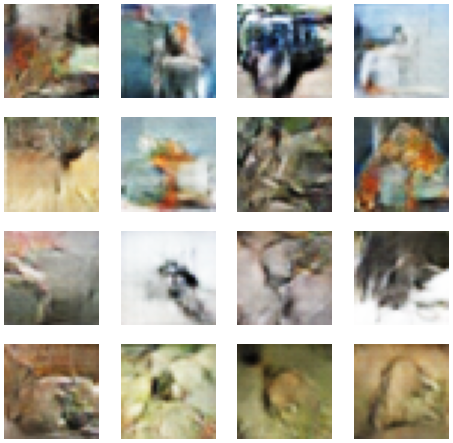

gif : https://github.com/TaeWonKang95/Aiffel_Exploration/blob/7dd5f069d7060eacbdc3eb5a5069acdca305ea19/Exploration.10/cifar10_dcgan_try10.gif

- epoch를 한 번에 500번 돌렸을 때(version.3.04) 더 선명한 이미지를 얻었음
- checkpoint를 학습을 이어가면 이미지의 퀄리티가 조금 떨어질 수 있다고 판단됨

#### version.3.10
- version.3.09의 학습 결과에 따른 가중치(w)값을 checkpoint로 불러와 추가 학습시킴
- epochs : 500번
- 총 epochs 1,000번 (version.3.08 : 200번, version.3.09 : 300번, version.3.10 : 500번)

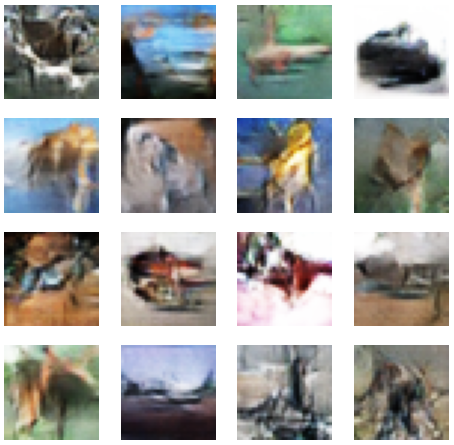

gif : https://github.com/TaeWonKang95/Aiffel_Exploration/blob/7dd5f069d7060eacbdc3eb5a5069acdca305ea19/Exploration.10/cifar10_dcgan_try11.gif

- 학습이 진행될수록 이미지가 서서히 깨지기 시작함 (학습량 과다로 판단됨)

### 4. version.4

- BATCH_SIZE = 256
    - BATCH_SIZE를 줄이고 Iter 30번마다 이미지를 저장하게 하여 다채로운 변화를 보고자 함
- Generator(생성자)
    - **Keras에서 추천해주는 Layer를 활용해봄**
    - **BatchNormalization 제거**
        - test이미지에 대해 새롭게 prediction을 만들 필요가 없으므로 overfitting을 방지할 필요성이 적다고 판단됨
    - LeakyReLU의 alpha값을 0.2로 지정하여 음수에 대한 영향력을 좀 더 키움
    - layer 6개
    - 첫 번째 : Dense
        - 4\*4\*256
        - LeakyReLU(alpha=0.2)
    - 두 번째 : Reshape : 4, 4, 256
    - 세 번째 : Conv2DTranspose : 
        - 128, kernel_size=(4, 4), strides=(2, 2), padding='same'
        - LeakyReLU(alpha=0.2)
    - 네 번재 : Conv2DTranspose : 
        - 128, kernel_size=(4, 4), strides=(2, 2), padding='same'
        - LeakyReLU(alpha=0.2)
    - 다섯 번재 : Conv2DTranspose : 
        - 128, kernel_size=(4, 4), strides=(2, 2), padding='same'
        - LeakyReLU(alpha=0.2)
    - 여섯 번재 : Conv2DTranspose : 
        - 3, kernel_size=(3, 3), strides=(1, 1), padding='same'
        - tanh
- discriminator(판별자)
    - **Dropout을 Flatten에서만 적용**
    - 첫 번째 : Conv2D
        - 64, (3, 3), strides=(3, 3), padding='same'
        - LeakyReLU(alpha=0.2)
    - 두 번째 : Conv2D
        - 128, (3, 3), strides=(2, 2), padding='same'
        - LeakyReLU(alpha=0.2)
    - 세 번째 : Conv2D
        - 128, (3, 3), strides=(2, 2), padding='same'
        - LeakyReLU(alpha=0.2)
    - 네 번째 : Conv2D
        - 256, (3, 3), strides=(2, 2), padding='same'
        - LeakyReLU(alpha=0.2)    
    - 네 번째 : Flatten
        - Dropout(0.3)
    - 다섯 번째 : Dense(1)
- learning rate : 0.0002
- optimizer Adam의 beta_1을 0.5로 지정함 (생성자, 판별자 동일)
    - beta_1의 디폴트 값 : 0.9
    - momentum과 관련되어 있는 beta_1의 값을 줄여 관성을 줄임
- EPOCHS : 200

#### version.4.01

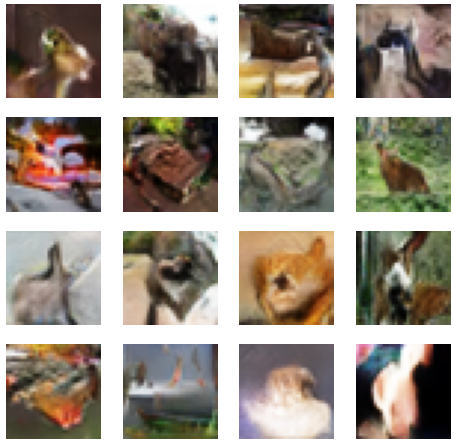

gif : https://github.com/TaeWonKang95/Aiffel_Exploration/blob/7dd5f069d7060eacbdc3eb5a5069acdca305ea19/Exploration.10/cifar10_dcgan_try12.gif

- version.3보다 더 적은 epoch으로 이미지 형태를 빠르게 찾아감

#### version.4.02
- version.4.01의 학습 결과에 따른 가중치(w)값을 checkpoint로 불러와 추가 학습시킴
- epochs : 200번
- 총 epochs 400번 (version.4.01 : 200번, version.4.02 : 200번)

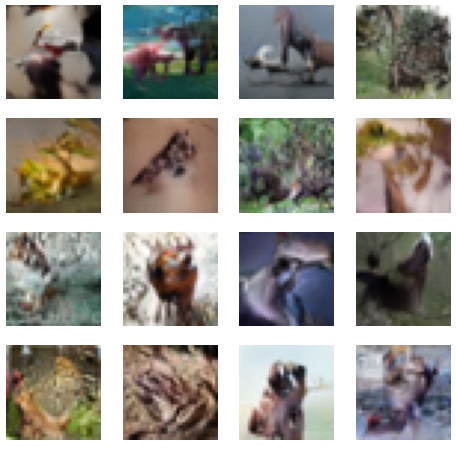

gif : https://github.com/TaeWonKang95/Aiffel_Exploration/blob/7dd5f069d7060eacbdc3eb5a5069acdca305ea19/Exploration.10/cifar10_dcgan_try13.gif

- 대체로 이미지 형태를 더 잘 잡음

#### version.4.03
- version.4.02의 학습 결과에 따른 가중치(w)값을 checkpoint로 불러와 추가 학습시킴
- epochs : 200번
- 총 epochs 600번 (version.4.01 : 200번, version.4.02 : 200번, version.4.03 : 200번)

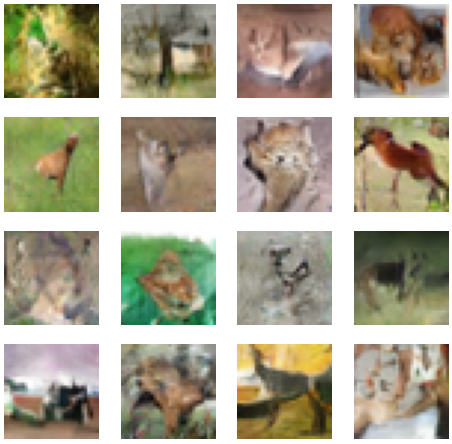

gif : https://github.com/TaeWonKang95/Aiffel_Exploration/blob/7dd5f069d7060eacbdc3eb5a5069acdca305ea19/Exploration.10/cifar10_dcgan_try14.gif

- 변화량이 크게 느껴지지 않음
- 일부 이미지의 형태가 깨지기 시작함

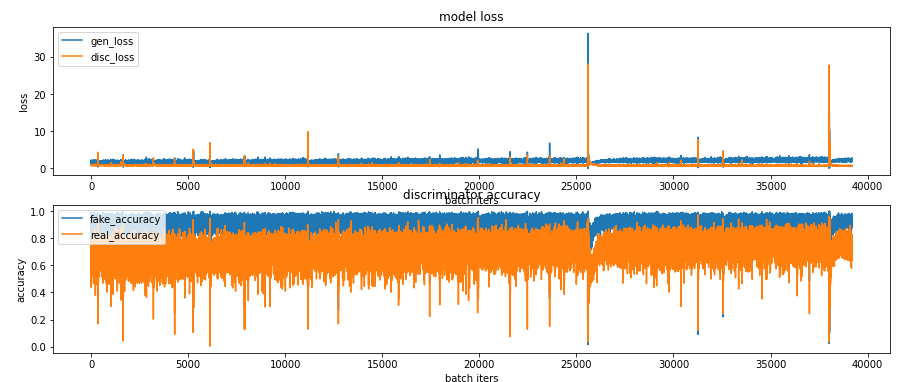

- fake_accuracy가 서서히 떨어짐
- fake_accuracy와 real_accuracy가 크게 떨어지는 지점이 두 곳 발생함

#### version.4.05
- version.4.02의 학습 결과에 따른 가중치(w)값을 checkpoint로 불러와 추가 학습시킴
    - version.4.03에서 이미지 일부가 깨지므로 추가 학습량을 줄임
- epochs : 20번
- 총 epochs 420번 (version.4.01 : 200번, version.4.02 : 200번, version.4.05 : 20번)

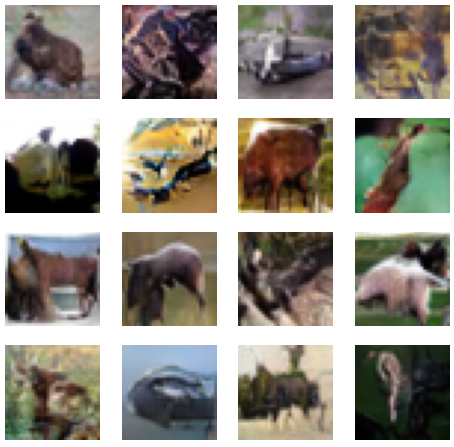

gif : https://github.com/TaeWonKang95/Aiffel_Exploration/blob/7dd5f069d7060eacbdc3eb5a5069acdca305ea19/Exploration.10/cifar10_dcgan_try16.gif

- 초기 형태에 대해 epoch가 너무 적어 변화량이 거의 없음

## 결론

- 이미지의 형태
    - version.3.04, version.3.05, version.4.02, version.4.05의 이미지 형태가 가장 뚜렷한 것으로 판단됨
- 이미지 별로 형태가 잡히는데 걸리는 시간이 서로 상이함
    - 틈틈이 체크한 결과 일찍 형태가 잡히는 이미지는 일찍 이미지가 깨지는 것을 볼 수 있었음
    - 이미지 별로 학습량에 따른 w업데이트 결과가 다르게 나타날 수 있음을 시사함
- 판별자(Discriminator)에 비해 생성자(Generator)의 성능이 부족한 것 같다고 판단됨
    - Generator의 Overfitting을 방지할 필요성이 비교적 적게 느껴짐

## 회고

### 1. 새로 알아갔던 점
 - GAN의 존재와 구조를 알게됨
 - accuracy가 무조건 높다고 좋은 것은 아니라는 것을 알게됨 (GAN에서의 real_accuracy와 fake_accuracy는 0.5가 될 때가 이상적임)
 - cycleGAN의 존재와 구조를 알게됨

### 2. 흥미로웠던 점
 - 학습을 통해 이미지를 새롭게 만들어내는 점
 - 이미지가 뚜렷하게 나오지 않아 여러 시도와 고민을 해보며 개선했던 점
 - 생성자(Generator)와 판별자(Discriminator)의 연관성이 흥미로웠음

### 3. 아쉬웠던 점
 - GAN을 통해 생성한 이미지의 퀄리티가 생각보다 좋지 않은 것 같다는 생각을 함
 - 학습 시간이 매우 오래 걸려 과제에 할애한 시간이 매우 많이 들었음
 - Github에 올릴 수 있는 용량 한계가 25MB여서 일부 gif파일을 따로 업로드 한 점

### 4. 앞으로의 다짐
 - cycleGAN도 도전해보고 싶다는 생각을 함